# <center>Deep Learning UFC</center>

We build a neural network to predict the winner of a UFC fight. We use the data from the [UFC dataset](https://www.kaggle.com/rajeevw/ufcdata) from Kaggle.

In [1]:
# downloading UFC dataset from kaggle
!kaggle datasets download -d mrmorj/ufcdata
# unzip the dataset
!unzip ufcdata.zip
# import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, classification_report
# load the dataset
df = pd.read_csv('data.csv')
# check the first 5 rows
df.head()
# check the shape of the dataset
df.shape
# check the columns
df.columns
# check the datatypes
df.dtypes



zsh:1: command not found: kaggle
unzip:  cannot find or open ufcdata.zip, ufcdata.zip.zip or ufcdata.zip.ZIP.


ModuleNotFoundError: No module named 'seaborn'

In [40]:
# run this cell to import needed modules and define plotting functions (no input needed)
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from numpy import linalg as LA
import plotly
import plotly.graph_objects as go
import random, time
from collections import Counter
from sklearn.model_selection import train_test_split
import json
from sklearn.datasets import fetch_openml
import json
from json import JSONEncoder

# we will use this later to save weights as JSON files
class NumpyArrayEncoder(JSONEncoder):
    def default(self, obj):
        if isinstance(obj, np.ndarray):
            return obj.tolist()
        return JSONEncoder.default(self, obj)

# function to plot costs
def plot_costs(costs):
    plt.plot(costs)
    plt.xlabel("iterations")
    plt.ylabel("cost")
    plt.show()
    
# function to plot costs
def plot_grads(grads):
    plt.plot(grads)
    plt.xlabel("iterations")
    plt.ylabel("gradient norm")
    plt.show()

# defining a function to plot data
def plot_data(X,Y,size_ = 2):
    m = len(X)
    plot_figure = go.Figure(data=[go.Scatter3d(x=X[:,0], y=X[:,1], z=[r[0] for r in Y], mode='markers',marker=dict(size=size_))])
    plotly.offline.iplot(plot_figure)

# defining a function to plot models fit
def plot_fit(X,Y,W,B,G,size_ = 2):
    trace = go.Scatter3d(x=X[:,0], y=X[:,1], z=[r[0] for r in Y], mode='markers',marker=dict(size=size_))
    xs,ys = X[:,0],X[:,1]
    xxx = np.outer(np.linspace(min(xs), max(xs), 30), np.ones(30))
    yyy = np.outer(np.linspace(min(ys), max(ys), 30), np.ones(30)).T
    zzz = np.zeros([30,30])
    D = len(G)-1
    for i in range(30):
        for j in range(30):
            zzz[i,j] = feedforward(W,B,G,np.array([xxx[i,j],yyy[i,j]]))[D][0]
    # Configure the layout.
    layout = go.Layout(margin={'l': 0, 'r': 0, 'b': 0, 't': 0})
    data = [trace,go.Surface(x=xxx, y=yyy, z=zzz, showscale=False, opacity=0.5)]
    # Render the plot.
    plot_figure = go.Figure(data=data, layout=layout)
    plot_figure.update_layout(
        scene = dict(
            xaxis = dict(nticks=4, range=[min(X[:,0]),max(X[:,0])],),
            yaxis = dict(nticks=4, range=[min(X[:,1]),max(X[:,1])],),
            zaxis = dict(nticks=4, range=[min(Y),max(Y)],),),
        width=700,
        margin=dict(r=20, l=10, b=10, t=10))
    plotly.offline.iplot(plot_figure)

def ReLU(x,deriv = False):
    if deriv:
        return np.diag((x>0).astype(int))
    return [max(0,x[i]) for i in range(len(x))]

def Linear(x,deriv = False):
    if deriv:
        return np.identity(len(x))
    return x

def Sigmoid(x,deriv = False):
    if deriv:
        return np.diag(Sigmoid(x,False)*(1-Sigmoid(x,False)))
    return 1/(1+np.exp(-x))

def Squared(x,deriv = False):
    if deriv:
        return np.diag([2*x[i] for i in range(len(x))])
    return x**2

def Softmax(x,deriv = False):
    if deriv:
        gx = Softmax(x,deriv = False)
        return np.diag(gx) - np.outer(gx,gx)
    denom = sum([np.exp(x[i]) for i in range(len(x))])
    return np.array([np.exp(x[i])/denom for i in range(len(x))])


# Note: Nx and y are always numpy arrays (for 'bce' they always have only one entry)
# when deriv = False the output must be a number and when deriv = True the output must be a vector
def loss(Nx,y,cost_type,deriv = False):
    if cost_type == 'se':
        if deriv:
            return 2*(Nx-y).T
        return LA.norm(Nx-y,2)**2
    elif cost_type == 'ce':
        if deriv:
            return -y.T@np.diag(np.array([1/Nx[i] for i in range(len(Nx))]))
        return -np.inner(y,np.log(Nx))
    elif cost_type == 'bce':
        if deriv:
            return np.array([-y[0]/Nx[0]+(1-y[0])/(1-Nx[0])])
        return -y[0]*np.log(Nx[0])-(1-y[0])*np.log(1-Nx[0])

def feedforward(W,B,G,x):
    D = len(W)
    feeds = []
    for l in range(D):
        s = W[l]@x+B[l]
        feeds.append([x,s])
        #print(x,s)
        x = G[l+1](s)
    feeds.append([G[D](s)])
    return feeds

def deltas(X_feeds,Y,W,B,G,verbose = False, cost_type = 'se'):
    D = len(W)
    deltas_dict = {}
    for i in X_feeds.keys():
        deltas_dict[i]=[]
        l = D-1
        xD = X_feeds[i][l+1][0]
        sl = X_feeds[i][l][1]
        delta = loss(xD,Y[i,:],cost_type,deriv = True)@G[l+1](sl,True)
        if verbose:
            print(f'l = {l}')
            print(f'the shape of x({D}): {xD.shape}')
            print(f'the shape of s({l}): {sl.shape}')
            print(f'the shape of delta({l}): {delta.shape}')
        deltas_dict[i].append(delta)
        while l>=1:
            l-=1
            sl = X_feeds[i][l][1]
            if verbose:
                print(f'the shape of s({l}): {sl.shape}')
                print(f'the shape of delta({l}): {deltas_dict[i][-1].shape}')
                print(f'the shape of W[{l+1}]: {W[l+1].shape}')
            delta = (deltas_dict[i][-1]@W[l+1])@G[l+1](sl,True)
            if verbose:
                print(f'l = {l}')
                print(f'the shape of s({l}): {sl.shape}')
                print(f'the shape of deltas[{i}][{l}]: {deltas_dict[i][-1].shape}')
                print(f'the shape of W[{l+1}]: {W[l+1].shape}')
                print(f'delta = {delta}')
            deltas_dict[i].append(delta)
        deltas_dict[i].reverse()
    return deltas_dict

def grads(X,Y,W,B,G,batch, lambda_ = 0, verbose = False,cost_type = 'se'):
    dWs = []
    dBs = []
    m,D = len(X),len(W)
    X_feeds = {}
    for i in batch:
        x=X[i,:]
        feeds=feedforward(W,B,G,x)
        X_feeds[i] = feeds
    X_deltas = deltas(X_feeds,Y,W,B,G,verbose,cost_type)
    for l in range(D):
        if verbose:
            print(f'the shape of s({l}): {X_feeds[i][l][0]}')
            print(f'the shape of delta({l}): {X_deltas[i][l]}')
        dWs.append(1/m*sum([np.outer(X_deltas[i][l],X_feeds[i][l][0]) for i in batch]) + 2*lambda_*W[l])
        dBs.append(1/m*sum([X_deltas[i][l] for i in batch]))
    return dWs,dBs,X_feeds

#max_iters should be a multiple of 100
def fit(X,Y,arch,G,alpha = 1e-9, momentum = .01, batch_size = 100, 
        lambda_ = 0, max_iters = 100,verbose = False, cost_type = 'se',print_costs = True):
    
    W,B,VW,VB = [],[],[],[]
    D,m = len(G)-1,len(X)
    for l in range(D):
        W.append(np.random.normal(0, 2/(arch[l+1]+arch[l]), size=(arch[l+1], arch[l])))
        B.append(np.zeros(arch[l+1]))
        VW.append(np.zeros(W[l].shape))
        VB.append(np.zeros(B[l].shape))
    epochs = 0
    costs = []
    while epochs<=max_iters:
        batch = random.sample(range(m),batch_size)
        dWs,dBs,feeds = grads(X,Y,W,B,G,batch,lambda_,verbose,cost_type)
        cost = 0
        for i in batch:
            Nx = feeds[i][D][0]
            cost += loss(Nx,Y[i],cost_type)/batch_size
        costs.append(cost)
        if epochs%(np.floor(max_iters/30))==0 and print_costs:
            print(f'epoch: {epochs}')
            print(f'           cost: {cost}')
        if verbose:
            print('computed grads')
        for l in range(D):
            VW[l] = momentum*VW[l]-alpha*dWs[l]
            W[l] = W[l] + VW[l]
            VB[l] = momentum*VB[l]-alpha*dBs[l]
            B[l] = B[l] + VB[l]
        epochs+=1
    return W,B,costs
        

To test your backprop function, lets see if we can fit a linear function with a single hidden layer.

In [5]:
#defines a dataset (no input needed)
X = np.random.rand(10000,2)*50 - np.random.rand(10000,2)*100
def p_data(p):
    return p[0] - p[1] + np.random.normal(0,10)
Y = np.array([[p_data(p)] for p in X])
plot_data(X,Y,size_ = 1)

In [6]:
# pick an architecture arch with a single hidden layer and activations G
# both arch and G should be lists of size 3 (input, hidden, output)
# we always pick Linear for the input activation and the rest are your choice
arch = [2,2,1]
G = [Linear, Linear, Linear]

In [7]:
# run backpropagation after choosing alpha, batch_size, lambda_ and max_iters
W,B,costs,grad_norms = fit(X,Y,arch,G,alpha = 2e-3,batch_size = 100, lambda_ = 0, max_iters = 1000)

epoch: 0
           cost: 1254.388828649582
epoch: 33
           cost: 99.00055994299075
epoch: 66
           cost: 97.13729987708346
epoch: 99
           cost: 83.31192502356589
epoch: 132
           cost: 86.34807288111351
epoch: 165
           cost: 106.54621862758394
epoch: 198
           cost: 97.38481185016643
epoch: 231
           cost: 94.83381490469377
epoch: 264
           cost: 109.96285384821866
epoch: 297
           cost: 97.85949615409716
epoch: 330
           cost: 109.09667131057508
epoch: 363
           cost: 90.37087501205097
epoch: 396
           cost: 84.1226758745467
epoch: 429
           cost: 114.3500848874224
epoch: 462
           cost: 100.06039193234466
epoch: 495
           cost: 97.90968452494376
epoch: 528
           cost: 84.92334697787035
epoch: 561
           cost: 98.06884808283316
epoch: 594
           cost: 80.65712599246756
epoch: 627
           cost: 123.8813119141291
epoch: 660
           cost: 97.92451877334175
epoch: 693
           cost: 92.67961

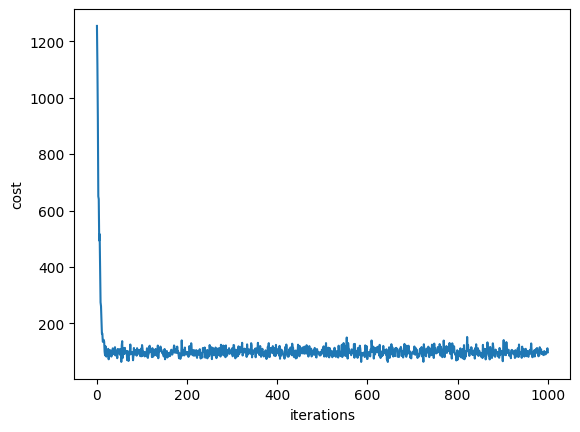

In [8]:
# plot the costs  (no input needed)
plot_costs(costs)

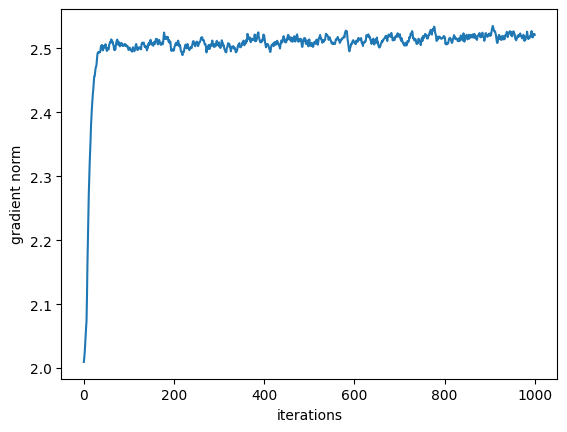

In [9]:
# no input needed
# plot the gradient norms (don't expect this to go to 0... we do not in general find a local minimum)
# plotting the gradient norms sometimes lets us know if our fit is failing because we are getting stuck
# in a bad local minimum (turns out this is rare)
plot_grads(grad_norms)

In [10]:
# See how well your result fits the training set (no input needed)
plot_fit(X,Y,W,B,G,size_ = 1)

# Problem 5

The goal of this problem is to fit a quadradic function. All you have to do is pick an architecture and hyperparameters. Use at least 3 different activation functions and at least 2 hidden layers. 

In [11]:
# defining a dataset (no input needed)
X = np.random.rand(10000,2)*50 - np.random.rand(10000,2)*100
def p_data(p):
    return p[0]**2 - p[1]**2 + np.random.normal(0,500)
Y = np.array([[p_data(p)] for p in X])
plot_data(X,Y,size_ = 1)

In [12]:
# choose your architecture, activations, and hyperparameters
# the default values given in this cell will not work well so you must make changes to get a good fit
# suggestion: keep track of "good builds" by copy/pasting your choices into an empty cell and recording performance
arch = [2,5,5,1]
G = [Linear,Squared,ReLU,Linear,]
W,B,costs,grad_norms = fit(X,Y,arch,G,alpha = 1e-7, 
                                momentum = .4,batch_size=100,lambda_=.01,max_iters=10000)

epoch: 0
           cost: 8226758.395747976
epoch: 333
           cost: 1496174.0388320547
epoch: 666
           cost: 249379.57261015626
epoch: 999
           cost: 195311.71825975424
epoch: 1332
           cost: 213301.08417052004
epoch: 1665
           cost: 237281.75174348487
epoch: 1998
           cost: 265536.5002294346
epoch: 2331
           cost: 287677.1008861751
epoch: 2664
           cost: 216739.46336925618
epoch: 2997
           cost: 227484.1888599545
epoch: 3330
           cost: 206119.47748411633
epoch: 3663
           cost: 262941.7903964632
epoch: 3996
           cost: 297322.09538351436
epoch: 4329
           cost: 264060.37887593993
epoch: 4662
           cost: 234244.3698446735
epoch: 4995
           cost: 249849.705225298
epoch: 5328
           cost: 248028.35207807753
epoch: 5661
           cost: 230446.0642258169
epoch: 5994
           cost: 292660.66679402126
epoch: 6327
           cost: 256275.921761762
epoch: 6660
           cost: 270712.3280658099
epoch: 699

In [20]:
# Use this cell to keep track of well-performing models


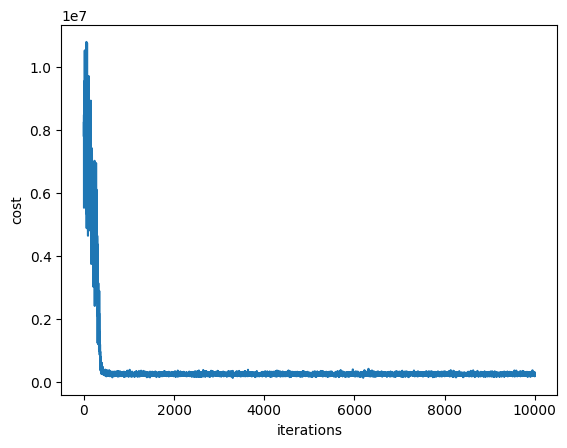

In [13]:
# plot the costs (no input needed)
plot_costs(costs)

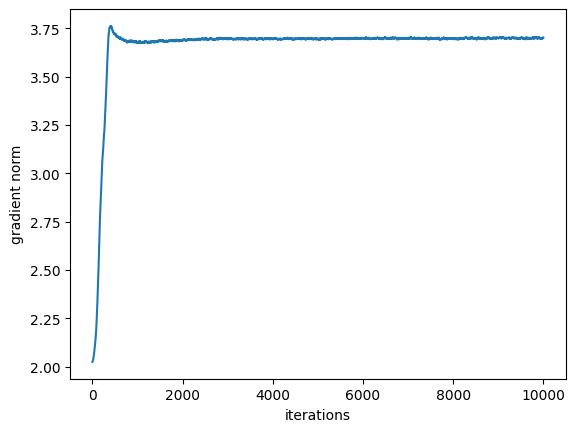

In [14]:
# plot the gradient norms (no input needed)
plot_grads(grad_norms)

In [15]:
# see how well your model fits the dataset (no input needed)
plot_fit(X,Y,W,B,G,size_ = 2)

Plot the hidden features in the second-to-last layer (should be a layer of size two) versus the corresponding targets.

In [16]:
# here is a function which plots the hidden features in the second-to-last layer (no input needed)
def plot_hidden_features(X,Y,W,B,G,size_ = 2):
    D = len(G) - 1
    m = len(X)
    X_feeds = {}
    for i in range(m):
        x=X[i,:]
        feeds=feedforward(W,B,G,x)
        X_feeds[i] = feeds
    XH = np.array([X_feeds[i][D-1][0] for i in range(m)])
    plot_figure = go.Figure(data=[go.Scatter3d(x=XH[:,0], y=XH[:,1], z=[r[0] for r in Y], mode='markers',marker=dict(size=size_))])
    plotly.offline.iplot(plot_figure)

In [17]:
# since the last layer is linear (regression problem) the hidden features should approximately lie on a plane
plot_hidden_features(X,Y,W,B,G)

## Explain

In the context of the previous part, explain how the neural network fits the data when the last layer is linear.

Your explanation goes here (double click into the markdown cell)



## Problem 5 Continued

In the following cells, build a neural network without using the `Squared` activation and see how well you can fit this data. Use the `plot_fit` function to visualize the way your model has fit the data. 

Hint: you will have to try many architectures and hyperparameter values. Keep track of those which worked well so if you change and decrease performance, you know how to get back to a decent model.

In [26]:
# Use this cell to keep track of well-performing models

# arch = [2,5,5,5,1]
# G = [Linear,ReLU,ReLU,ReLU,Linear,]
# W,B,costs,grad_norms = fit(X,Y,arch,G,alpha = 1e-5, 
                                momentum = .1,batch_size=50,lambda_=.01,max_iters=15000)
# final_cost = 695449.8394479576

In [27]:
# choose your architecture, activations, and hyperparameters
arch = [2,5,5,5,1]
G = [Linear,ReLU,ReLU,ReLU,Linear,]
W,B,costs,grad_norms = fit(X,Y,arch,G,alpha = 1e-5, 
                                momentum = .1,batch_size=50,lambda_=.01,max_iters=15000)


epoch: 0
           cost: 11546461.878439423
epoch: 500
           cost: 6486094.233379168
epoch: 1000
           cost: 1284471.8038785048
epoch: 1500
           cost: 939384.7096409438
epoch: 2000
           cost: 857014.9212581941
epoch: 2500
           cost: 846102.046139543
epoch: 3000
           cost: 896959.0606200557
epoch: 3500
           cost: 676121.9642271793
epoch: 4000
           cost: 816213.3988286491
epoch: 4500
           cost: 804806.1085471106
epoch: 5000
           cost: 593130.8127675068
epoch: 5500
           cost: 935673.1161283972
epoch: 6000
           cost: 651189.1695971395
epoch: 6500
           cost: 914712.4738731502
epoch: 7000
           cost: 759093.6080901433
epoch: 7500
           cost: 944917.0287670781
epoch: 8000
           cost: 852641.882750664
epoch: 8500
           cost: 925357.7072478337
epoch: 9000
           cost: 1056340.8112625582
epoch: 9500
           cost: 692123.4720604147
epoch: 10000
           cost: 667270.8218328123
epoch: 10500
  

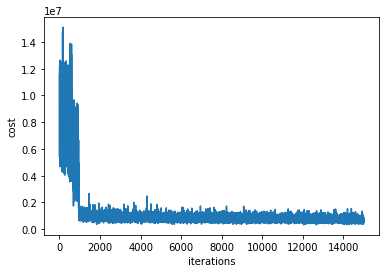

In [28]:
# plot the costs (no input needed)
plot_costs(costs)

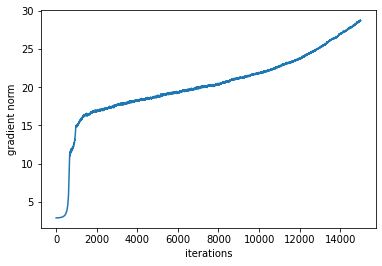

In [29]:
# plot the norms of gradients (no input needed)
plot_grads(grad_norms)

In [30]:
# see how well your model fits the dataset
plot_fit(X,Y,W,B,G,size_ = 2)

# Problem 6

The point of this problem is to use a neural network as a multiclass classifier. We will load the iris dataset. Each data point is a list of measurements of sepals and petals of a given iris plant. The targets correspond to the different species of iris plants. There are 3 different species. There are 4 measurements in each data point. 

To start, you must define a function `predict(W,B,G,x)` which takes as an input a data point `x` (i.e. a 4-dimensional vector) and the output is a one-hot encoding of the prediction your model gives i.e. either `np.array([1,0,0])`, `np.array([0,1,0])`, or `np.array([0,0,1])`.

In [31]:
# define prediction
def predict(W,B,G,x):
    
    feeds = feedforward(W,B,G,x)
    Nx = feeds[-1][0]
    i = np.argmax(Nx)
    answer = np.zeros(3)
    answer[i]=1
    return answer

In [32]:
# grabs a toy dataset from sklearn datasets (no input needed)
from sklearn.datasets import load_iris,load_digits
data = load_iris()
X = data.data
Y = np.zeros((data.target.shape[0],3))
for i in range(data.target.shape[0]):
    Y[i] = np.zeros(3)
    Y[i][data.target[i]]=1

The following cell creates a test set and validation set to test hyperparameters. This can be done quickly using `sklearn`.

In [33]:
# creating validation and test set (no input needed)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=3)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=4) # 0.25 x 0.8 = 0.2

Now it is time to choose an architecture to train your model.

In [34]:
# choose an architecture, appropriate activation functions, and hyperparameters
arch = [4,10,3]
G = [Linear,ReLU,Softmax,]
W,B,costs,grad_norms = fit(X_train,y_train,arch,G,alpha = 5e-2,
                                momentum = .2,batch_size=30,lambda_=0.01,max_iters=5000, cost_type = 'ce')

epoch: 0
           cost: 1.1488562609463464
epoch: 166
           cost: 0.5412628377298728
epoch: 332
           cost: 0.3764932878365638
epoch: 498
           cost: 0.32956877930686107
epoch: 664
           cost: 0.25638319379938096
epoch: 830
           cost: 0.2638459196913287
epoch: 996
           cost: 0.2958640467035622
epoch: 1162
           cost: 0.2849010398341438
epoch: 1328
           cost: 0.21536649028992613
epoch: 1494
           cost: 0.21051863471855328
epoch: 1660
           cost: 0.2314046727877497
epoch: 1826
           cost: 0.22599402192100418
epoch: 1992
           cost: 0.21151935446113407
epoch: 2158
           cost: 0.19796884599922612
epoch: 2324
           cost: 0.2553654616027976
epoch: 2490
           cost: 0.2990740377822221
epoch: 2656
           cost: 0.28506434622016896
epoch: 2822
           cost: 0.25673656094127356
epoch: 2988
           cost: 0.23075226420973485
epoch: 3154
           cost: 0.251992029373006
epoch: 3320
           cost: 0.213064191

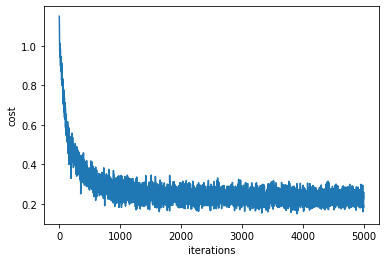

In [35]:
# plot the costs (no input needed)
plot_costs(costs)

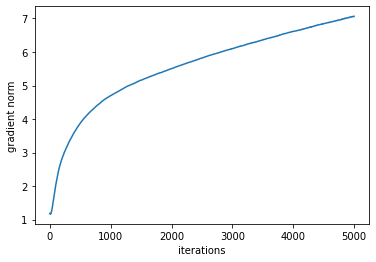

In [36]:
# plot the gradient norms (no input needed)
plot_grads(grad_norms)

## Measuring performance

Next, write code to compute the accuracy (number of correct predictions divided by number of examples) in the training set, validation set, and test set. Recall to get the best possible model, you should optimize the accuracy on the validation set. The accuracy on the test set is only computed after doing this to get a realistic expectation of your generalization error. Note: on such a small dataset there may be a lot of variance in these figures (specifically in validation and test set accuracy). 

In [37]:
# compute training accuracy (write code to compute the accuracy of predictions on the training set)
acc_train = 0
m_train = len(X_train)
for i in range(len(X_train)):
    if all(predict(W,B,G,X_train[i,:])==y_train[i,:]):
        acc_train+=1/m_train
acc_train

0.9777777777777763

In [38]:
# compute validation accuracy (write code to compute the accuracy of predictions on the validation set)
acc_val = 0
m_val = len(X_val)
for i in range(len(X_val)):
    if all(predict(W,B,G,X_val[i,:])==y_val[i,:]):
        acc_val+=1/m_val
acc_val

0.9999999999999999

In [39]:
# compute test accuracy (write code to compute the accuracy of predictions on the test set)
acc_test = 0
m_test = len(X_test)
for i in range(len(X_test)):
    if all(predict(W,B,G,X_test[i,:])==y_test[i,:]):
        acc_test+=1/m_test
acc_test

0.9666666666666666

# Problem 7

The purpose of this problem is to predict handwritten digits with a neural network and compare performance to the naive Bayes model in the previous assignment.

Our dataset will be the same as the one used in the previous assignment. Start by writing a function `predict(W,B,G,x,output_type = 'vector')` which takes a typical row of the dataset (flattened vector of intensities) and gives the model prediction as an output. Note we will use a neural network with Softmax output layer so predictions are made by finding the argument of the maximum entry of the output. Feed the input through the model and return a one-hot encoding of the prediction in the case that `output_type == 'vector'` or the digit prediction as an integer if `output_type == 'number'`.

In [40]:
# define prediction
def predict(W,B,G,x,output_type = 'vector'):
    
    feeds = feedforward(W,B,G,x)
    Nx = feeds[-1][0]
    i = np.argmax(Nx)
    if output_type == 'number':
        return i
    answer = np.zeros(10)
    answer[i]=1
    return answer

In [41]:
# load the dataset and convert to one-hot encoding (no input needed)
digit_data = load_digits()
X = digit_data.data
Y = np.zeros((digit_data.target.shape[0],10))
for i in range(digit_data.target.shape[0]):
    Y[i,:][digit_data.target[i]]=1

In [42]:
# split dataset into a training set, validation set, and test set (no input needed)
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1) # 0.25 x 0.8 = 0.2

In [43]:
#Use this cell to keep track of best performing models (no input needed)

#arch = [64,11,10]
#G = [Linear,ReLU,Softmax,]
#W,B,costs = backprop(X_train,y_train,arch,G,alpha = .05, momentum = .2,batch_size=60,lambda_=.004,max_iters=30000,cost_type = 'ce')#accuracy on validation set: .694
# accuracy on test set .969

In [44]:
# choose your architecture, activations, and hyperparameters
arch = [64,11,10]
G = [Linear,ReLU,Softmax,]
W,B,costs,grad_norms = fit(X_train,y_train,arch,G,alpha = .05, 
                                momentum = .2,batch_size=60,lambda_=.004,max_iters=5000,cost_type = 'ce')

epoch: 0
           cost: 2.3680322769752884
epoch: 166
           cost: 1.4599032940214252
epoch: 332
           cost: 0.832802699807161
epoch: 498
           cost: 0.5991913821179392
epoch: 664
           cost: 0.6219587230660159
epoch: 830
           cost: 0.46675764376509826
epoch: 996
           cost: 0.3754896085102654
epoch: 1162
           cost: 0.31201588855848866
epoch: 1328
           cost: 0.30399855996241537
epoch: 1494
           cost: 0.27008565597839795
epoch: 1660
           cost: 0.28312306955525957
epoch: 1826
           cost: 0.2607782101336895
epoch: 1992
           cost: 0.2570836986062084
epoch: 2158
           cost: 0.21945616371183582
epoch: 2324
           cost: 0.260400787897351
epoch: 2490
           cost: 0.3508230942385117
epoch: 2656
           cost: 0.22541200062472044
epoch: 2822
           cost: 0.2434644114707668
epoch: 2988
           cost: 0.23385486483350765
epoch: 3154
           cost: 0.24354473380774067
epoch: 3320
           cost: 0.22826442533

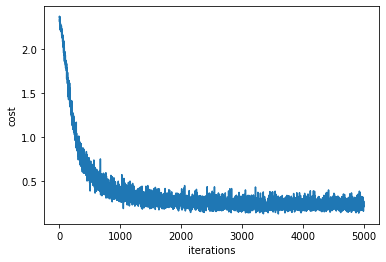

In [45]:
# plot the costs (no input needed)
plot_costs(costs)

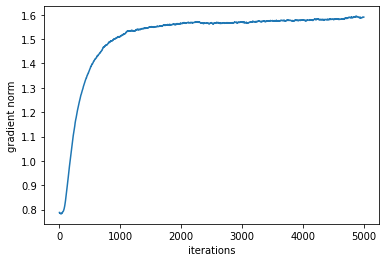

In [46]:
# plot the norms of gradients (no input needed)
plot_grads(grad_norms)

In [47]:
# compute training accuracy (write code to compute the accuracy of predictions on the training set)
acc_train = 0
m_train = len(X_train)
for i in range(len(X_train)):
    if all(predict(W,B,G,X_train[i,:])==y_train[i,:]):
        acc_train+=1/m_train
acc_train

0.9637883008356714

In [48]:
# compute validation accuracy (write code to compute the accuracy of predictions on the validation set)
acc_val = 0
m_val = len(X_val)
for i in range(len(X_val)):
    if all(predict(W,B,G,X_val[i,:])==y_val[i,:]):
        acc_val+=1/m_val
acc_val

0.9388888888888861

In [49]:
# compute test accuracy (write code to compute the accuracy of predictions on the test set)
acc_test = 0
m_test = len(X_test)
for i in range(len(X_test)):
    if all(predict(W,B,G,X_test[i,:])==y_test[i,:]):
        acc_test+=1/m_test
acc_test

0.9499999999999972

## Check your own handwritten digits

Get a piece of paper and a pen. Write down four digits of your choice, preferably legibly. Take pictures of each digit, and crop them to nearly square and tightly centered windows around the digit. Move the image files (preferably as `.jpg` files) to the same folder on your computer which contains this notebook. Save them as `a.jpg`, `b.jpg`, `c.jpg`, `d.jpg`. Use the following to check how the model classifies them. Make sure to change `r` to the optimal value found in the previous step.

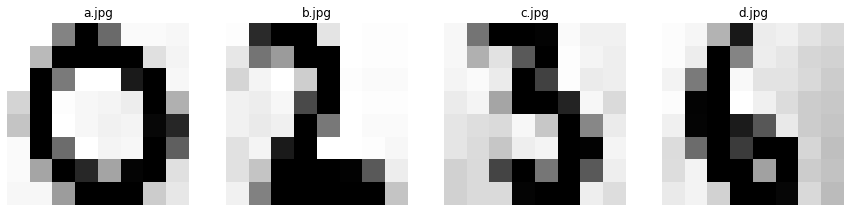

In [50]:
# before running, make sure you have files a.jpg, b.jpg, c.jpg, d.jpg in the folder containing this notebook
# check: you should see the converted images of your files plotted below
from PIL import Image, ImageEnhance # importing some packages to handle images
from matplotlib import image
digit_images, digit_arrays = {}, {}
for i in ['a','b','c','d']: #for each i this converts the image to an 8 by 8 matrix with values from 0 to 16
    digit_image = Image.open(f"{i}.jpg") # opening your image
    digit_image = digit_image.resize((8,8)) # resize to 8 by 8 pixels
    digit_image = ImageEnhance.Contrast(digit_image).enhance(10).convert('LA') # preprocess (contrast & grayscale)
    digit_images[i] = digit_image
    digit_arr = np.asarray(digit_images[i])[:,:,0] # create as 3-tensor but only need 0 slice matrix
    digit_arr = (255 - digit_arr) # had opposite grayscale convention, need to correct it
    digit_arr = digit_arr/255*16 # had entries up to 255 but we only want it up to 16 
    digit_arr = np.rint(digit_arr-3) # rounding to integer values
    digit_arr = digit_arr.clip(min = 0) # attempting to get rid of background darkness
    digit_arrays[i] = digit_arr
_, axes = plt.subplots(nrows=1, ncols=4, figsize=(15, 10))
for ax, image, label in zip(axes, digit_images.values(), digit_images.keys()):
    ax.set_axis_off()
    ax.imshow(image, cmap=plt.cm.gray_r, interpolation="nearest")
    ax.set_title(f"{label}.jpg")

In [51]:
# check: seeing if your model reads the digits correctly
for i in ['a','b','c','d']:
    x = np.reshape(digit_arrays[i],64)
    prediction = predict(W,B,G,x,output_type = 'number')
    print(f'predicted digit for {i}.jpg with Neural Network: {prediction}')

predicted digit for a.jpg with Neural Network: 0
predicted digit for b.jpg with Neural Network: 2
predicted digit for c.jpg with Neural Network: 5
predicted digit for d.jpg with Neural Network: 6


## Explain...

In the Previous assignment, we never computed the accuracy of the naive Bayes model. Go back now and compute the training accuracy (the number of correct predictions divided by the number of examples). It takes awhile to compute, so it suffices to just use the first 200 training examples. You can modify the code used to compute training accuracy above. What is the accuracy of the naive Bayes model? Does the neural network model outperform the naive Bayes model?

Your answer goes here... 

# Problem 8

See if you can handle a nonlinear binary classification task. You will construct a neural network whose output is a probability (number between 0 and 1). We will not bother with a validation set or test set but instead just try and see if we can fit the training set.

Start by defining a prediction function, with a parameter `output_type` such that when when `output_type` is set to `'number'`, the output is `0` if the probability (the last feedforward) is less than `.5` and `1` otherwise. When `output_type` is set to `probability` then the output should be just the probability (the last feedforward)

In [52]:
# define prediction
def predict(W,B,G,x,output_type = 'number'):
    
    feeds = feedforward(W,B,G,x)
    Nx = feeds[-1][0]
    if output_type == 'probability':
        return Nx[0]
    if Nx[0]<.5:
        return 0
    else:
        return 1

In [53]:
# Generating and plotting a binary classification dataset to test our neural network (no input needed)
points = np.random.normal(0, 50, size=(10000,3))
y,c = [],[]
for point in points:
    if point[0]**2+point[1]**2+point[2]**2<60**2:
        y.append([1])
        c.append('red')
    else:
        y.append([0])
        c.append('blue')
X,y = np.array(points), np.array(y)
# visualize the dataset 
trace = go.Scatter3d(x=X[:,0], y=X[:,1], z=X[:,2], mode='markers',marker=dict(size = 1,color=c))
plot_figure = go.Figure(data = [trace])
plotly.offline.iplot(plot_figure)

In [54]:
# choose your architecture, activations, and hyperparameters
arch = [3,8,5,1]
G = [Linear,ReLU,ReLU,Sigmoid,]
W,B,costs,grad_norms = fit(X,y,arch,G,alpha = .8, momentum = 0.2,
                           batch_size=20,lambda_=0,max_iters=100000,cost_type = 'bce')

epoch: 0
           cost: 1.186988761896454
epoch: 3333
           cost: 0.27199892439429374
epoch: 6666
           cost: 0.3747558986455245
epoch: 9999
           cost: 0.40012992720090385
epoch: 13332
           cost: 0.30999201746639504
epoch: 16665
           cost: 0.18706330693755713
epoch: 19998
           cost: 0.23202691059341818
epoch: 23331
           cost: 0.11280714886125494
epoch: 26664
           cost: 0.15101645837025285
epoch: 29997
           cost: 0.14911266420152056
epoch: 33330
           cost: 0.13706997951613425
epoch: 36663
           cost: 0.16040121654704811
epoch: 39996
           cost: 0.11947916812641572
epoch: 43329
           cost: 0.07524473095538298
epoch: 46662
           cost: 0.059578727425074064
epoch: 49995
           cost: 0.1681048080364325
epoch: 53328
           cost: 0.03748307171636925
epoch: 56661
           cost: 0.12057908010619979
epoch: 59994
           cost: 0.00824779758483199
epoch: 63327
           cost: 0.027780774648191103
epoch: 66

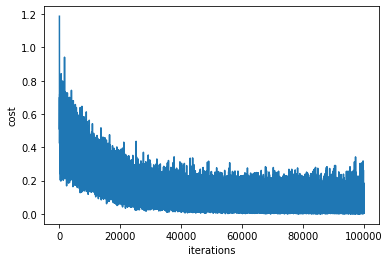

In [55]:
#plot the costs (no input needed)
plot_costs(costs)

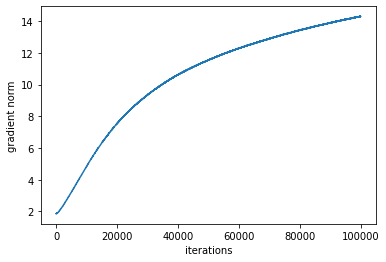

In [56]:
#plot the costs (no input needed)
plot_costs(costs)
#plot the norms of gradients (no input needed)
plot_grads(grad_norms)

In [57]:
# compute training accuracy
acc = 0
m = len(X)
for i in range(len(X)):
    if predict(W,B,G,X[i,:])==y[i][0]:
        acc+=1/m
print(f'the model has accuracy: {acc}')

the model has accuracy: 0.9731999999999091


Let us plot the decision boundary. This is done by plotting all of the points with whose predictions are in a small neighborhood of `.5`.

In [58]:
# no input needed
# green points indicate the decision boundary (points near .5 probability)
# may have to zoom in to get past blue points to see the decision boundary
red_points = []
blue_points = []
boundary_points = []
for i in range(len(X)):
    point = X[i,:]
    prob = predict(W,B,G,X[i,:],output_type='probability')
    if abs(prob-.5)<.1:
        boundary_points.append(point)
    else:
        if point[0]**2+point[1]**2+point[2]**2<60**2:
            red_points.append(point)
        else:
            blue_points.append(point)
X_blue,X_red,X_boundary = np.array(blue_points),np.array(red_points),np.array(boundary_points)
# visualize the dataset 
trace_red = go.Scatter3d(x=X_red[:,0], y=X_red[:,1], z=X_red[:,2], mode='markers',marker=dict(size = 2,color='red'))
trace_blue = go.Scatter3d(x=X_blue[:,0], y=X_blue[:,1], z=X_blue[:,2], mode='markers',marker=dict(size = 1,color='blue'))
trace_boundary = go.Scatter3d(x=X_boundary[:,0], y=X_boundary[:,1], z=X_boundary[:,2], mode='markers',marker=dict(size = 6,color='green'))
plot_figure = go.Figure(data = [trace_red,trace_blue,trace_boundary])
plotly.offline.iplot(plot_figure)

# Problem 9

Lets see how our built-from-scratch neural net performs on a larger dataset. We will load the MNIST handwritten digits dataset. We are using the `openml` module to fetch this dataset. Try to attain an accuracy on the test set of at least 93%. It should be possible to get 95% or higher with enough tuning. 

Start by defining a prediction function based on a softmax output activation which returns the predicted number.

In [59]:
# define prediction
def predict(W,B,G,x):
    feeds = feedforward(W,B,G,x)
    Nx = feeds[-1][0]
    return np.argmax(Nx)

In [60]:
# no input needed
# import dataset (may take a moment)
mnist = fetch_openml('mnist_784')
X = mnist.data.to_numpy()
y = mnist.target.to_numpy()

In [61]:
# no input needed
# split data into training set, validation set, and test set, and create one-hot encoding of targets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1) # 0.25 x 0.8 = 0.2

Yt = np.zeros((len(y_train),10))
for i in range(len(y_train)):
    Yt[i,:][int(y_train[i])]=1
    
m_val = len(X_val)

In [62]:
# use this cell to keep track of best hyperparameter choices

#arch = [784,500,300,10]
#G = [Linear,ReLU,ReLU,Softmax,]
#W,B,costs,grad_norms = fit(X_train,Yt,arch,G,alpha = 3, momentum = .05,batch_size=30,lambda_=.00004,max_iters=3000,cost_type = 'ce')
#the accuracy on the training set is: 0.9388333333337826
#the accuracy on the validation set is: 0.9330000000002041

#arch = [784,600,400,200,10]
#G = [Linear,ReLU,ReLU,ReLU,Softmax,]
#W,B,costs,grad_norms = fit(X_train,Yt,arch,G,alpha = 32, momentum = .2,batch_size=30,lambda_=.000004,max_iters=3000,cost_type = 'ce')
#the accuracy on the training set is: 0.9443571428575952
#the accuracy on the validation set is: 0.9380000000002069

In [63]:
# choose your architecture, activations, and hyperparameters
arch = [784,650,650,10]
G = [Linear,ReLU,ReLU,Softmax,]
W,B,costs,grad_norms = fit(X_train,Yt,arch,G,alpha = 3, momentum = .2,
                     batch_size=10,lambda_=.000001,max_iters=1000,cost_type = 'ce',print_costs = True)



epoch: 0
           cost: 2.301725943889639
epoch: 33
           cost: 2.294695493768768
epoch: 66
           cost: 2.2807132123403875
epoch: 99
           cost: 2.261125698565025
epoch: 132
           cost: 2.2483033415933535
epoch: 165
           cost: 2.1951202753040455
epoch: 198
           cost: 2.1237661880317567
epoch: 231
           cost: 2.0369517390249094
epoch: 264
           cost: 1.458508821018918
epoch: 297
           cost: 1.5077383789553058
epoch: 330
           cost: 0.9269092633450978
epoch: 363
           cost: 1.0318713428533808
epoch: 396
           cost: 0.713174259058835
epoch: 429
           cost: 0.46548720929142784
epoch: 462
           cost: 0.4945332223342875
epoch: 495
           cost: 0.9369933209925675
epoch: 528
           cost: 0.6032043781460719
epoch: 561
           cost: 1.1456618905228495
epoch: 594
           cost: 0.19029205091874607
epoch: 627
           cost: 0.898526121992609
epoch: 660
           cost: 2.172348329658707
epoch: 693
           c

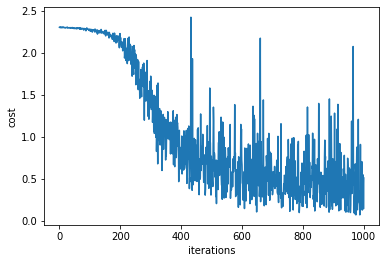

In [64]:
#plot your costs (no input needed)
plot_costs(costs)

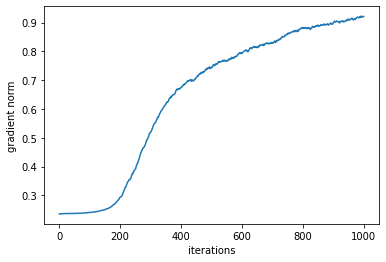

In [65]:
#plot your gradient norms (no input needed)
plot_grads(grad_norms)

In [66]:
# compute validation accuracy (write code to compute validation set accuracy of current model)
acc_val = len([i for i in range(m_val) if predict(W,B,G,X_val[i,:])==int(y_val[i])])/m_val
print(f'the accuracy on the validation set is: {acc_val}')

the accuracy on the validation set is: 0.8491428571428571


The following cells gives a technique to iteratively build models to find a high performing set of parameters. Each time you find a model which performs better than the existing best performing model, it will save over the weight values, bias values, architecture, and activations to JSON files "weights.json", "biases.json", "arch.json", "G.json". We turn `print_costs` to `False` to avoid a huge number of outputs. This will print the validation set accuracy every time we reach `max_iters` iterations, and indicate if this is better than the best accuracy seen so far.

In [67]:
# use this variable to keep track of the highest validation set accuracy you've seen so far (acc_val_highest)
# careful... if you come back and rerun this cell it sets the variable back to zero, 
# then your best model may get replaced if you run the following cell afterwards.
# if you restart the notebook, you may want to manually set this to the highest accuracy you've found so far
acc_val_highest = 0

In [68]:
# NOTE: You have to manually stop this cell from running otherwise it will run forever
# Copy your best architecture, activation, and hyperparameter values below
# repetitively run model on your best architecture found above. (no input needed)
# try letting this run for an hour minimum
# think of this as taking several SGD walks using your best architecture, stopping after a certain number
# of iterations and then restarting. You get a sampling of good parameter values, and each time you 
# get the best performance you've seen so far, we save the parameter values to a JSON file
# after running this for a long time, hopefully you'll find a model that performs very well.
WT,BT = [],[]
while True:
    ######### choose your architecture, activations, and hyperparameters ###########
    arch = [784,700,700,10]
    G = [Linear,ReLU,ReLU,Softmax,]
    W,B,costs,grad_norms = fit(X_train,Yt,arch,G,alpha = 3, momentum = .2,
                         batch_size=20,lambda_=.000001,max_iters=3000,cost_type = 'ce',print_costs = False)
    ################################################################################
    # compute validation accuracy
    acc_val = len([i for i in range(m_val) if predict(W,B,G,X_val[i,:])==int(y_val[i])])/m_val
    print(f'the accuracy on the validation set is: {acc_val}')
    if acc_val>acc_val_highest:
        acc_val_highest = acc_val
        WT,BT = W,B
        print(f'the new highest accuracy on the validation set: {acc_val}')
        jsonFile = open("weights.json", "w+")
        jsonFile.seek(0) # absolute file positioning
        jsonFile.truncate() # to erase all data 
        jsonFile.close()
        jsonFile = open("biases.json", "w+")
        jsonFile.seek(0) # absolute file positioning
        jsonFile.truncate() # to erase all data 
        jsonFile.close()
        jsonFile = open("arch.json", "w+")
        jsonFile.seek(0) # absolute file positioning
        jsonFile.truncate() # to erase all data 
        jsonFile.close()
        jsonFile = open("G.json", "w+")
        jsonFile.seek(0) # absolute file positioning
        jsonFile.truncate() # to erase all data 
        jsonFile.close()
        print('deleted old weights from weights.json and biases from biases.json')
        # Serialization
        Ws,Bs = {l:W[l] for l in range(len(W))},{l:B[l] for l in range(len(B))}
        archs,Gs = {l:arch[l] for l in range(len(arch))},{l:str(G[l]) for l in range(len(G))}
        print("serialized W,B,arch,G into JSON and saved to JSON files weights.json, biases.json, arch.json and G.json")
        with open("weights.json", "w") as write_file:
            json.dump(Ws, write_file, cls=NumpyArrayEncoder)
        with open("biases.json", "w") as write_file:
            json.dump(Bs, write_file, cls=NumpyArrayEncoder)
        with open("arch.json", "w") as write_file:
            json.dump(archs, write_file, cls=NumpyArrayEncoder)
        with open("G.json", "w") as write_file:
            json.dump(Gs, write_file, cls=NumpyArrayEncoder)


the accuracy on the validation set is: 0.9452857142857143
the new highest accuracy on the validation set: 0.9452857142857143
deleted old weights from weights.json and biases from biases.json
serialized W,B,arch,G into JSON and saved to JSON files weights.json, biases.json, arch.json and G.json
the accuracy on the validation set is: 0.9443571428571429
the accuracy on the validation set is: 0.9414285714285714
the accuracy on the validation set is: 0.949
the new highest accuracy on the validation set: 0.949
deleted old weights from weights.json and biases from biases.json
serialized W,B,arch,G into JSON and saved to JSON files weights.json, biases.json, arch.json and G.json
the accuracy on the validation set is: 0.9486428571428571
the accuracy on the validation set is: 0.9507142857142857
the new highest accuracy on the validation set: 0.9507142857142857
deleted old weights from weights.json and biases from biases.json
serialized W,B,arch,G into JSON and saved to JSON files weights.json, b

KeyboardInterrupt: 

In [69]:
# to fetch saved weights from local json file
fileObject = open("weights.json", "r")
jsonContent = fileObject.read()
Ws = json.loads(jsonContent)

fileObject = open("biases.json", "r")
jsonContent = fileObject.read()
Bs = json.loads(jsonContent)

# to fetch saved activations and architecture from local json file
fileObject = open("arch.json", "r")
jsonContent = fileObject.read()
archs = json.loads(jsonContent)

fileObject = open("G.json", "r")
jsonContent = fileObject.read()
Gs = json.loads(jsonContent)

# setting fetched parameters as our model parameters
W = [np.array(Ws[i]) for i in Ws.keys()]
B = [np.array(Bs[i]) for i in Bs.keys()]
arch = [archs[i] for i in archs.keys()]
G = [eval(Gs[i][10:][:-16]) for i in archs.keys()]

print(f'current best architecture: {arch}')
print(f'current best activation structure: {G}')

current best architecture: [784, 700, 700, 10]
current best activation structure: [<function Linear at 0x13c74a670>, <function ReLU at 0x13c74a550>, <function ReLU at 0x13c74a550>, <function Softmax at 0x13c74a8b0>]


In [70]:
# only run test accuracy after optimizing validation accuracy

In [71]:
# compute test accuracy
acc_test = 0
m_test = len(X_test)
for i in range(len(X_test)):
    if predict(W,B,G,X_test[i,:])==int(y_test[i]):
        acc_test+=1/m_test
acc_test
print(f'the accuracy on the test set is: {acc_test}')

the accuracy on the test set is: 0.9543571428573588


# Applying the Neural Network Constructed Above to UFC Data

In [142]:
#needed after restructuring of directory
import os
os.chdir('/Users/alexchandler/UFC_Prediction_2022')
#getting dependencies
import pandas as pd
pd.options.mode.chained_assignment = None  # default='warn' (disables SettingWithCopyWarning)

import numpy as npy
from datetime import datetime
from datetime import date
#this imports all of the functions from the file functions.py
os.chdir('/Users/alexchandler/UFC_Prediction_2022/src')
from fight_stat_helpers import *
os.chdir('/Users/alexchandler/UFC_Prediction_2022')

#importing csv fight data and saving as dataframes
ufc_fights_winner = pd.read_csv('src/content/data/processed/ufc_fights.csv',low_memory=False)
ufc_fights_method = pd.read_csv('src/content/data/processed/ufc_fights.csv',low_memory=False)
ufcfighterscrap =pd.read_csv('src/content/data/processed/fighter_stats.csv',sep=',',low_memory=False)

#cleaning the methods column for winner prediction 
#changing anything other than 'U-DEC','M-DEC', 'KO/TKO', 'SUB', to 'bullshit'
#changing 'U-DEC','M-DEC', to 'DEC'
#(counting split decisions as bullshit)
ufc_fights_winner['method'] = clean_method_for_winner_predictions_vect(ufc_fights_winner['method'])
ufc_fights_winner['method'].unique()

#cleaning the methods column for method prediction 
#changing anything other than 'U-DEC','M-DEC', 'S-DEC', 'KO/TKO', 'SUB', to 'bullshit'
#changing 'U-DEC','M-DEC', 'S-DEC', to 'DEC'
#(counting split decisions as decisions)
ufc_fights_method['method'] = clean_method_vect(ufc_fights_method['method'])
ufc_fights_method['method'].unique()

#getting rid of rows with incomplete or useless data
#fights with outcome "Win" or "Loss" (no "Draw")
draw_mask=ufc_fights_winner['result'] != 'D' 
#fights where the method of victory is TKO/SUB/DEC (no split decision or DQ or Overturned or anything else like that)
method_mask_winner=(ufc_fights_winner['method']!='bullshit')
method_mask_method=(ufc_fights_method['method']!='bullshit')
#fights where age is known
age_mask=(ufc_fights_winner['fighter_age']!='unknown')&(ufc_fights_winner['opponent_age']!='unknown')
#fights where height reach is known
height_mask=(ufc_fights_winner['fighter_height']!='unknown')&(ufc_fights_winner['opponent_height']!='unknown')
reach_mask=(ufc_fights_winner['fighter_reach']!='unknown')&(ufc_fights_winner['opponent_reach']!='unknown')
#fights where number of wins is known
wins_mask=(ufc_fights_winner['fighter_wins'] != 'unknown' )& (ufc_fights_winner['opponent_wins'] != 'unknown')
#fights where both fighters have strike statistics (gets rid of UFC debuts)
strikes_mask=(ufc_fights_winner['fighter_inf_sig_strikes_attempts_avg'] != 0)&(ufc_fights_winner['opponent_inf_sig_strikes_attempts_avg'] != 0)
#includes only the fights satisfying these conditions
ufc_fights_winner=ufc_fights_winner[draw_mask&method_mask_winner&age_mask&height_mask&reach_mask&wins_mask&strikes_mask]
ufc_fights_method=ufc_fights_method[draw_mask&method_mask_method&age_mask&height_mask&reach_mask&wins_mask&strikes_mask]
ufc_fights=ufc_fights[draw_mask&method_mask_winner&age_mask&height_mask&reach_mask&wins_mask&strikes_mask]

#listing all stats and making some new stats from them (differences often score higher in the learning models)
record_statistics=[u'fighter_wins', 
                   u'fighter_losses',
                   u'fighter_L5Y_wins',
                   u'fighter_L5Y_losses', 
                   u'fighter_L2Y_wins', 
                   u'fighter_L2Y_losses',
                    u'fighter_ko_wins',
                   u'fighter_ko_losses',
                   u'fighter_L5Y_ko_wins',
                   u'fighter_L5Y_ko_losses',
                   u'fighter_L2Y_ko_wins',
                    u'fighter_L2Y_ko_losses',
                   u'fighter_sub_wins',
                   u'fighter_sub_losses',
                   u'fighter_L5Y_sub_wins',
                    u'fighter_L5Y_sub_losses', 
                   u'fighter_L2Y_sub_wins', 
                   u'fighter_L2Y_sub_losses',
                   u'opponent_wins', 
                   u'opponent_losses',
                   u'opponent_L5Y_wins', 
                   u'opponent_L5Y_losses', 
                   u'opponent_L2Y_wins', 
                   u'opponent_L2Y_losses', 
                    u'opponent_ko_wins', 
                   u'opponent_ko_losses', 
                   u'opponent_L5Y_ko_wins', 
                   u'opponent_L5Y_ko_losses', 
                   u'opponent_L2Y_ko_wins',
                    u'opponent_L2Y_ko_losses', 
                   u'opponent_sub_wins', 
                   u'opponent_sub_losses',
                   u'opponent_L5Y_sub_wins', 
                    u'opponent_L5Y_sub_losses', 
                   u'opponent_L2Y_sub_wins', 
                   u'opponent_L2Y_sub_losses']

physical_stats=[ u'fighter_age',
                u'fighter_height',
                    u'fighter_reach',  
                u'opponent_age',  
                u'opponent_height',
                    u'opponent_reach']

#THERE MAY BE A PROBLEM IN AGE HEIGHT REACH TO DO WITH STRING VS FLOAT. MAKE SURE THESE ARE ALL THE CORRECT TYPE
#MAYBE WE ARE LOSING PREDICTABILITY HERE

#here is the list of all stats available (besides stance), does not include names or result
punch_statistics=[    u'fighter_inf_knockdowns_avg',
                    u'fighter_inf_pass_avg',
                    u'fighter_inf_reversals_avg',
                    u'fighter_inf_sub_attempts_avg',
                    u'fighter_inf_takedowns_landed_avg',
                    u'fighter_inf_takedowns_attempts_avg',
                    u'fighter_inf_sig_strikes_landed_avg',
                    u'fighter_inf_sig_strikes_attempts_avg',
                    u'fighter_inf_total_strikes_landed_avg',
                    u'fighter_inf_total_strikes_attempts_avg',
                    u'fighter_inf_head_strikes_landed_avg',
                    u'fighter_inf_head_strikes_attempts_avg',
                    u'fighter_inf_body_strikes_landed_avg',
                    u'fighter_inf_body_strikes_attempts_avg',
                    u'fighter_inf_leg_strikes_landed_avg',
                    u'fighter_inf_leg_strikes_attempts_avg',
                    u'fighter_inf_distance_strikes_landed_avg',
                    u'fighter_inf_distance_strikes_attempts_avg',
                    u'fighter_inf_clinch_strikes_landed_avg',
                    u'fighter_inf_clinch_strikes_attempts_avg',
                    u'fighter_inf_ground_strikes_landed_avg',
                    u'fighter_inf_ground_strikes_attempts_avg',
                
                    u'fighter_abs_knockdowns_avg',
                    u'fighter_abs_pass_avg',
                    u'fighter_abs_reversals_avg',
                    u'fighter_abs_sub_attempts_avg',
                    u'fighter_abs_takedowns_landed_avg',
                    u'fighter_abs_takedowns_attempts_avg',
                    u'fighter_abs_sig_strikes_landed_avg',
                    u'fighter_abs_sig_strikes_attempts_avg',
                    u'fighter_abs_total_strikes_landed_avg',
                    u'fighter_abs_total_strikes_attempts_avg',
                    u'fighter_abs_head_strikes_landed_avg',
                    u'fighter_abs_head_strikes_attempts_avg',
                    u'fighter_abs_body_strikes_landed_avg',
                    u'fighter_abs_body_strikes_attempts_avg',
                    u'fighter_abs_leg_strikes_landed_avg',
                    u'fighter_abs_leg_strikes_attempts_avg',
                    u'fighter_abs_distance_strikes_landed_avg',
                    u'fighter_abs_distance_strikes_attempts_avg',
                    u'fighter_abs_clinch_strikes_landed_avg',
                    u'fighter_abs_clinch_strikes_attempts_avg',
                    u'fighter_abs_ground_strikes_landed_avg',
                    u'fighter_abs_ground_strikes_attempts_avg',
                    
                    u'opponent_inf_knockdowns_avg',
                    u'opponent_inf_pass_avg',
                    u'opponent_inf_reversals_avg',
                    u'opponent_inf_sub_attempts_avg',
                    u'opponent_inf_takedowns_landed_avg',
                    u'opponent_inf_takedowns_attempts_avg',
                    u'opponent_inf_sig_strikes_landed_avg',
                    u'opponent_inf_sig_strikes_attempts_avg',
                    u'opponent_inf_total_strikes_landed_avg',
                    u'opponent_inf_total_strikes_attempts_avg',
                    u'opponent_inf_head_strikes_landed_avg',
                    u'opponent_inf_head_strikes_attempts_avg',
                    u'opponent_inf_body_strikes_landed_avg',
                    u'opponent_inf_body_strikes_attempts_avg',
                    u'opponent_inf_leg_strikes_landed_avg',
                    u'opponent_inf_leg_strikes_attempts_avg',
                    u'opponent_inf_distance_strikes_landed_avg',
                    u'opponent_inf_distance_strikes_attempts_avg',
                    u'opponent_inf_clinch_strikes_landed_avg',
                    u'opponent_inf_clinch_strikes_attempts_avg',
                    u'opponent_inf_ground_strikes_landed_avg',
                    u'opponent_inf_ground_strikes_attempts_avg',
                
                    u'opponent_abs_knockdowns_avg',
                    u'opponent_abs_pass_avg',
                    u'opponent_abs_reversals_avg',
                    u'opponent_abs_sub_attempts_avg',
                    u'opponent_abs_takedowns_landed_avg',
                    u'opponent_abs_takedowns_attempts_avg',
                    u'opponent_abs_sig_strikes_landed_avg',
                    u'opponent_abs_sig_strikes_attempts_avg',
                    u'opponent_abs_total_strikes_landed_avg',
                    u'opponent_abs_total_strikes_attempts_avg',
                    u'opponent_abs_head_strikes_landed_avg',
                    u'opponent_abs_head_strikes_attempts_avg',
                    u'opponent_abs_body_strikes_landed_avg',
                    u'opponent_abs_body_strikes_attempts_avg',
                    u'opponent_abs_leg_strikes_landed_avg',
                    u'opponent_abs_leg_strikes_attempts_avg',
                    u'opponent_abs_distance_strikes_landed_avg',
                    u'opponent_abs_distance_strikes_attempts_avg',
                    u'opponent_abs_clinch_strikes_landed_avg',
                    u'opponent_abs_clinch_strikes_attempts_avg',
                    u'opponent_abs_ground_strikes_landed_avg',
                    u'opponent_abs_ground_strikes_attempts_avg']



#adding record differences to ufc_fights
record_statistics_diff = []
half_length=int(len(record_statistics)/2)
for i in range(half_length):
    ufc_fights_winner[record_statistics[i]+'_diff_2']=ufc_fights_winner[record_statistics[i]]-ufc_fights_winner[record_statistics[i+half_length]]
    ufc_fights_method[record_statistics[i]+'_diff_2']=ufc_fights_method[record_statistics[i]]-ufc_fights_method[record_statistics[i+half_length]]
    record_statistics_diff.append(record_statistics[i]+'_diff_2')
    
#lets try and improve the greedy algorithm by considering differences. Lets start by replacing height and reach by their differences
ufc_fights_winner['height_diff']=ufc_fights_winner['fighter_height'].apply(float)-ufc_fights_winner['opponent_height'].apply(float)
ufc_fights_winner['reach_diff']=ufc_fights_winner['fighter_reach'].apply(float)-ufc_fights_winner['opponent_reach'].apply(float)
ufc_fights_method['height_diff']=ufc_fights_method['fighter_height'].apply(float)-ufc_fights_method['opponent_height'].apply(float)
ufc_fights_method['reach_diff']=ufc_fights_method['fighter_reach'].apply(float)-ufc_fights_method['opponent_reach'].apply(float)


physical_stats_diff = ['fighter_age_diff', 'height_diff', 'reach_diff']

#adding punch differences to ufc_fights
punch_statistics_diff = []
half_length=int(len(punch_statistics)/2)
for i in range(half_length):
    ufc_fights_method[punch_statistics[i]+'_diff_2']=ufc_fights_method[punch_statistics[i]]-ufc_fights_method[punch_statistics[i+half_length]]
    ufc_fights_winner[punch_statistics[i]+'_diff_2']=ufc_fights_winner[punch_statistics[i]]-ufc_fights_winner[punch_statistics[i+half_length]]
    punch_statistics_diff.append(punch_statistics[i]+'_diff_2')
    
possible_stats =record_statistics_diff+physical_stats_diff+punch_statistics_diff

#setting age to float
ufc_fights_winner['fighter_age'] = ufc_fights_winner['fighter_age'].apply(float)
ufc_fights_winner['opponent_age'] = ufc_fights_winner['opponent_age'].apply(float)
ufc_fights_method['fighter_age'] = ufc_fights_method['fighter_age'].apply(float)
ufc_fights_method['opponent_age'] = ufc_fights_method['opponent_age'].apply(float)
ufc_fights_winner['fighter_age_diff'] = ufc_fights_winner['fighter_age']-ufc_fights_winner['opponent_age']

ufc_fights_winner['fighter_age_diff_adj'] = (ufc_fights_winner['fighter_age']-23).apply(abs)-(ufc_fights_winner['opponent_age']-23).apply(abs)
current_best = ['fighter_age_diff', 
                '4-fighter_score_diff', 
                'fighter_abs_distance_strikes_attempts_avg_diff_2', 
                'fighter_abs_total_strikes_landed_avg_diff_2']


In [143]:
# choose your architecture, activations, and hyperparameters
#current_best = ['4-fighter_score_diff','9-fighter_score_diff','15-fighter_score_diff','1-fight_math','6-fight_math','fighter_L5Y_sub_wins_diff_2','fighter_L5Y_losses_diff_2','fighter_L5Y_ko_losses_diff_2','fighter_age_diff','fighter_abs_total_strikes_landed_avg_diff_2','fighter_abs_head_strikes_landed_avg_diff_2','fighter_inf_ground_strikes_landed_avg_diff_2','fighter_inf_takedowns_attempts_avg_diff_2','fighter_inf_head_strikes_landed_avg_diff_2',]
#X = ufc_fights_winner[current_best].to_numpy()
#y = ufc_fights_winner['result'].to_numpy()
#y = y.reshape(-1,1)
## replace each 'W' in y with 1 and each 'L' with 0
#y = np.where(y=='W', 1, 0)
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
#X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1) # 0.25 x 0.8 = 0.2
#arch = [X.shape[1],50, 30, 1]
#G = [Linear,ReLU,ReLU,Sigmoid,]
#W,B,costs= fit(X_train,y_train,arch,G,alpha = 2, momentum = 0.05,
#                     batch_size=100,lambda_=0.0001,max_iters=5000,cost_type = 'bce',print_costs = True)
# validation accuracy .601



In [154]:
# choose your architecture, activations, and hyperparameters
current_best = ['4-fighter_score_diff','9-fighter_score_diff','15-fighter_score_diff','1-fight_math','6-fight_math','fighter_L5Y_sub_wins_diff_2','fighter_L5Y_losses_diff_2','fighter_L5Y_ko_losses_diff_2','fighter_age_diff','fighter_abs_total_strikes_landed_avg_diff_2','fighter_abs_head_strikes_landed_avg_diff_2','fighter_inf_ground_strikes_landed_avg_diff_2','fighter_inf_takedowns_attempts_avg_diff_2','fighter_inf_head_strikes_landed_avg_diff_2',]
X = ufc_fights_winner[current_best].to_numpy()
y = ufc_fights_winner['result'].to_numpy()
y = y.reshape(-1,1)
# replace each 'W' in y with 1 and each 'L' with 0
y = np.where(y=='W', 1, 0)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1)
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.25, random_state=1) # 0.25 x 0.8 = 0.2
arch = [X.shape[1],50, 30, 30,1]
G = [Linear,ReLU,ReLU,ReLU,Sigmoid,]
W,B,costs= fit(X_train,y_train,arch,G,alpha = 2, momentum = 0.05,
                     batch_size=100,lambda_=0.0001,max_iters=5000,cost_type = 'bce',print_costs = True)



epoch: 0
           cost: 0.6931239437129247
epoch: 166
           cost: 0.695783337338522
epoch: 332
           cost: 0.6967180025516647
epoch: 498
           cost: 0.6527033460845316
epoch: 664
           cost: 0.6680023469228736
epoch: 830
           cost: 0.6290072454105003
epoch: 996
           cost: 0.6338436320815796
epoch: 1162
           cost: 0.6160511926494884
epoch: 1328
           cost: 0.6526036406133434
epoch: 1494
           cost: 0.6894182072499563
epoch: 1660
           cost: 0.6222627582897597
epoch: 1826
           cost: 0.6547076924443855
epoch: 1992
           cost: 0.6442613867025434
epoch: 2158
           cost: 0.6266048443256872
epoch: 2324
           cost: 0.6659897233325464
epoch: 2490
           cost: 0.6443886692598771
epoch: 2656
           cost: 0.7131747248057022
epoch: 2822
           cost: 0.6094330750326529
epoch: 2988
           cost: 0.702825527273321
epoch: 3154
           cost: 0.6219420864842485
epoch: 3320
           cost: 0.6126565079920571
epo

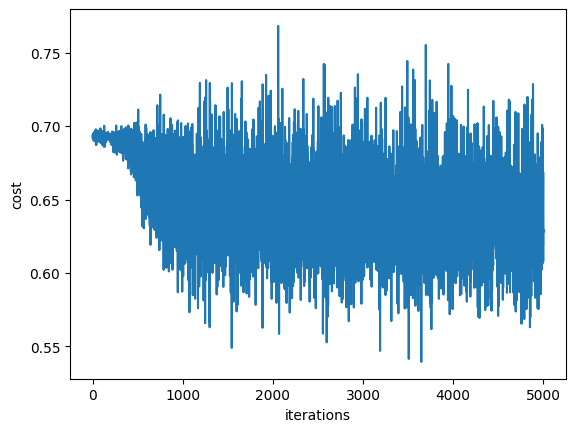

In [155]:
#plot the costs (no input needed)
plot_costs(costs)

In [156]:
# define prediction
def predict(W,B,G,x,output_type = 'number'):
    
    feeds = feedforward(W,B,G,x)
    Nx = feeds[-1][0]
    if output_type == 'probability':
        return Nx[0]
    if Nx[0]<.5:
        return 0
    else:
        return 1

In [157]:
# compute training accuracy
acc = 0
m = len(X)
for i in range(len(X)):
    if predict(W,B,G,X[i,:])==y[i][0]:
        acc+=1/m
print(f'the model has accuracy: {acc}')

the model has accuracy: 0.6190597204574515


In [158]:
# compute validation accuracy (write code to compute the accuracy of predictions on the validation set)
acc_val = 0
m_val = len(X_val)
for i in range(len(X_val)):
    if predict(W,B,G,X_val[i,:])==y_val[i][0]:
        acc_val+=1/m_val
acc_val

0.5908513341804323